# Florence-2 - Advancing a Unified Representation for a Variety of Vision Tasks

We introduce **Florence-2**, a novel vision foundation model with a unified, prompt-based representation for a variety of computer vision and vision-language tasks. 

While existing large vision models excel in transfer learning, they struggle to perform a diversity of tasks with simple instructions, a capability that implies handling the complexity of various spatial hierarchy and semantic granularity. 

Florence-2 was designed to take **text-prompt** as task instructions and generate desirable results in text forms, whether it be **captioning, object detection, grounding or segmentation**. This multi-task learning setup demands large-scale, high-quality annotated data. 

To this end, we co-developed FLD-5B that consists of **5.4 billion comprehensive visual annotations on 126 million images**, using an iterative strategy of automated image annotation and model refinement. We adopted a sequence-to-sequence structure to train Florence-2 to perform versatile and comprehensive vision tasks. Extensive evaluations on numerous tasks demonstrated Florence-2 to be a strong vision foundation model contender with unprecedented zero-shot and fine-tuning capabilities.

https://huggingface.co/papers/2311.06242

https://huggingface.co/collections/microsoft/florence-6669f44df0d87d9c3bfb76de

In [1]:
#%pip install transformers
#%pip install torch 
#%pip install timm
#%pip install flash_attn
#%pip install einops

In [2]:
import copy
import datetime
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import requests
import sys
import torch

from PIL import Image, ImageDraw, ImageFont
from transformers import AutoProcessor, AutoModelForCausalLM
%matplotlib inline

/anaconda/envs/azureml_py310_sdkv2/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
!nvidia-smi

Wed Jun 19 21:42:40 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.171.04             Driver Version: 535.171.04   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-PCIE-16GB           On  | 00000001:00:00.0 Off |                  Off |
| N/A   28C    P0              25W / 250W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [4]:
print(f"Python version: {sys.version}")

Python version: 3.10.14 (main, May  6 2024, 19:42:50) [GCC 11.2.0]


In [5]:
print(f"Today is {str(datetime.datetime.today())}")

Today is 2024-06-19 21:42:40.513208


## Model

In [6]:
model_id = 'microsoft/Florence-2-large'

model = AutoModelForCausalLM.from_pretrained(model_id,
                                             trust_remote_code=True).eval()
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

## Helper functions

In [7]:
def florence2(task_prompt, text_input=None):
    """
    Calling the Microsoft Florence2 model
    """
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input

    inputs = processor(text=prompt, images=image, return_tensors="pt")

    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids,
                                            skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height))

    return parsed_answer

In [8]:
def plot_bbox(image, data):
    """
    Plot BBox
    """
    fig, ax = plt.subplots(figsize=(15, 10))
    ax.imshow(image)

    for bbox, label in zip(data['bboxes'], data['labels']):
        x1, y1, x2, y2 = bbox
        rect = patches.Rectangle((x1, y1),
                                 x2 - x1,
                                 y2 - y1,
                                 linewidth=2,
                                 edgecolor='lime',
                                 facecolor='none')
        ax.add_patch(rect)
        plt.text(x1,
                 y1,
                 label,
                 color='black',
                 fontsize=8,
                 bbox=dict(facecolor='lime', alpha=1))

    ax.axis('off')
    plt.show()

In [9]:
def draw_polygons(image, prediction, fill_mask=False):
    """
    Draws segmentation masks with polygons on an image.

    Parameters:
    - image_path: Path to the image file.
    - prediction: Dictionary containing 'polygons' and 'labels' keys.
                  'polygons' is a list of lists, each containing vertices of a polygon.
                  'labels' is a list of labels corresponding to each polygon.
    - fill_mask: Boolean indicating whether to fill the polygons with color.
    """
    draw = ImageDraw.Draw(image)
    scale = 1

    for polygons, label in zip(prediction['polygons'], prediction['labels']):
        color = "lime"
        fill_color = "lime" if fill_mask else None

        for _polygon in polygons:
            _polygon = np.array(_polygon).reshape(-1, 2)
            if len(_polygon) < 3:
                print('Invalid polygon:', _polygon)
                continue

            _polygon = (_polygon * scale).reshape(-1).tolist()
            if fill_mask:
                draw.polygon(_polygon, outline=color, fill=fill_color)
            else:
                draw.polygon(_polygon, outline=color)
            draw.text((_polygon[0] + 8, _polygon[1] + 2), label, fill=color)

    display(image)

In [10]:
def convert_to_od_format(data):
    """
    Converts a dictionary with 'bboxes' and 'bboxes_labels' into a dictionary with separate 'bboxes' and 'labels' keys.
    Parameters:
    - data: The input dictionary with 'bboxes', 'bboxes_labels', 'polygons', and 'polygons_labels' keys.
    Returns:
    - A dictionary with 'bboxes' and 'labels' keys formatted for object detection results.
    """
    bboxes = data.get('bboxes', [])
    labels = data.get('bboxes_labels', [])
    od_results = {'bboxes': bboxes, 'labels': labels}

    return od_results

In [11]:
def draw_ocr_bboxes(image, prediction):
    """
    Draw OCR BBox
    """
    scale = 1
    draw = ImageDraw.Draw(image)
    bboxes, labels = prediction['quad_boxes'], prediction['labels']

    for box, label in zip(bboxes, labels):
        color = 'lime'
        new_box = (np.array(box) * scale).tolist()
        draw.polygon(new_box, width=4, outline=color)
        draw.text((new_box[0] + 8, new_box[1] + 2),
                  "{}".format(label),
                  align="right",
                  fill=color)
    
    display(image)

## 1. Image

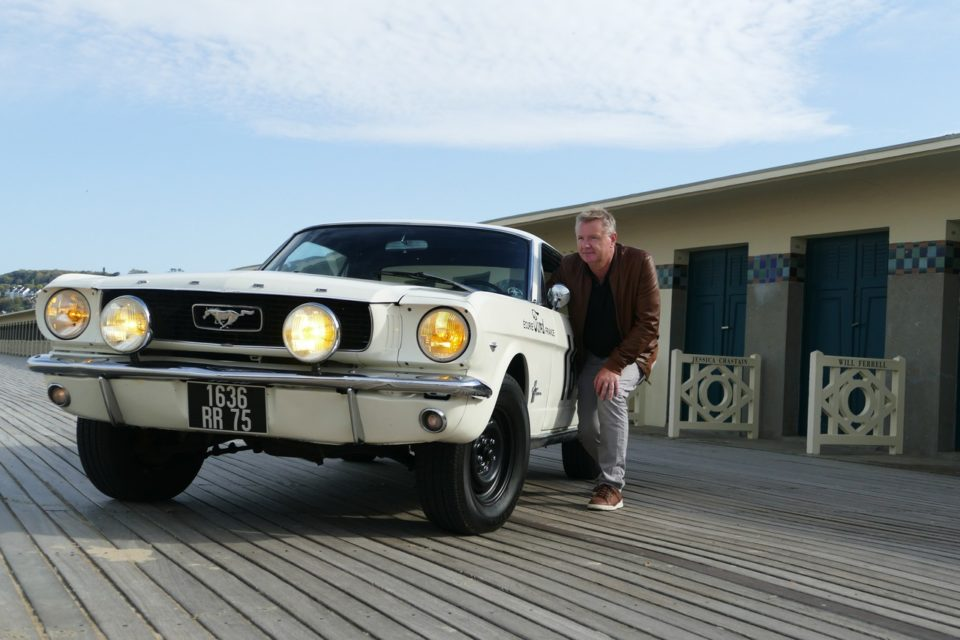

In [12]:
url = "https://github.com/retkowsky/images/blob/master/car.jpg?raw=true"

image = Image.open(requests.get(url, stream=True).raw)
image

## 2. Run pre-defined tasks without additional inputs

### 2.1 Captions

In [13]:
task_prompt = '<CAPTION>'

result = florence2(task_prompt)
print("\033[1;31;34m")
print(result)


{'<CAPTION>': 'A man standing next to a white car on a wooden deck.'}


In [14]:
task_prompt = '<DETAILED_CAPTION>'

result = florence2(task_prompt)
print("\033[1;31;34m")
print(result)


{'<DETAILED_CAPTION>': 'The image shows a man standing next to a white Mustang on a wooden boardwalk. He is wearing a brown jacket, pants, and shoes. In the background, there is a building with doors and windows, a fence, trees, and a clear blue sky.'}


In [15]:
task_prompt = '<MORE_DETAILED_CAPTION>'

result = florence2(task_prompt)
print("\033[1;31;34m")
print(result)


{'<MORE_DETAILED_CAPTION>': 'The image shows a man standing next to a white Ford Mustang car on a wooden deck. The man is wearing a brown jacket, jeans, and sneakers. He is leaning against the car with his hands in his pockets. The car has a black grille and headlights, and the license plate reads "1636 RR 75". In the background, there is a building with blue doors and a white fence. The sky is blue and there are trees and hills visible in the distance.'}


### 2.2 Object detection

OD results format:
{'\<OD>':
    {
    'bboxes': [[x1, y1, x2, y2], ...],
    'labels': ['label1', 'label2', ...]
    }
}

In [16]:
task_prompt = '<OD>'

results = florence2(task_prompt)
print("\033[1;31;34m")
print(results)


{'<OD>': {'bboxes': [[805.9199829101562, 350.3999938964844, 905.760009765625, 455.3599853515625], [720.47998046875, 326.0799865722656, 730.0799560546875, 329.91998291015625], [281.7599792480469, 302.3999938964844, 340.32000732421875, 363.1999816894531], [99.36000061035156, 295.3599853515625, 152.16000366210938, 352.9599914550781], [416.1600036621094, 307.5199890136719, 469.91998291015625, 362.55999755859375], [43.68000030517578, 288.9599914550781, 90.72000122070312, 339.5199890136719], [544.7999877929688, 207.67999267578125, 661.9199829101562, 511.67999267578125], [547.6799926757812, 283.8399963378906, 570.719970703125, 310.0799865722656], [25.439998626708984, 219.1999969482422, 600.47998046875, 535.3599853515625], [186.72000122070312, 381.7599792480469, 267.3599853515625, 432.9599914550781], [380.6399841308594, 270.3999938964844, 477.5999755859375, 292.1600036621094]], 'labels': ['chair', 'door handle', 'headlight', 'headlight', 'headlight', 'headlight', 'person', 'rearview mirror', 

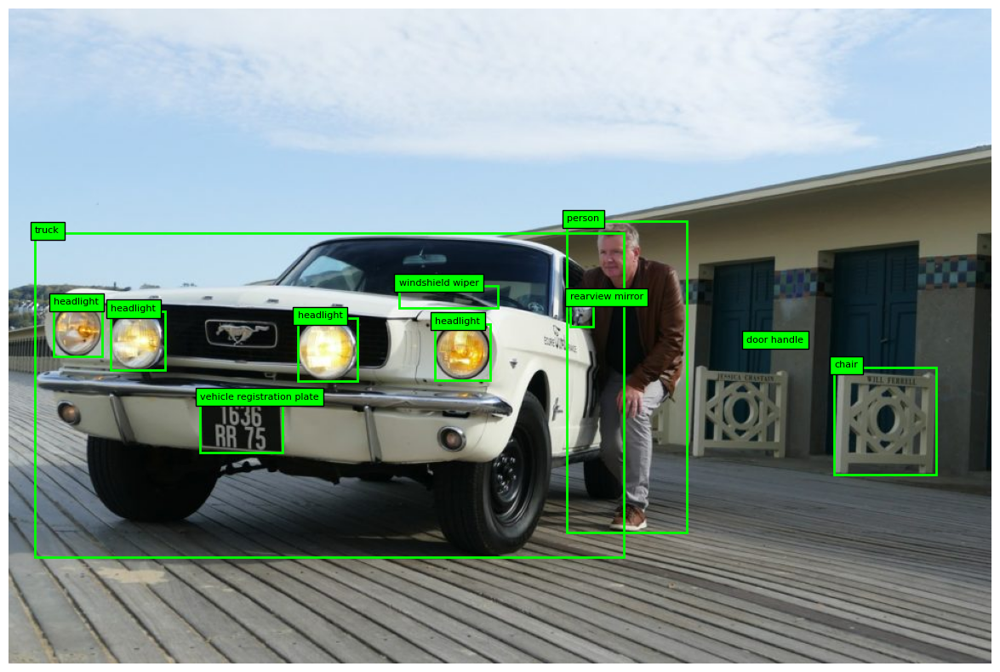

In [17]:
plot_bbox(image, results['<OD>'])

### 2.3 Dense region caption

Dense region caption results format:
{'\<DENSE_REGION_CAPTION>': {'bboxes': [[x1, y1, x2, y2], ...], 'labels': ['label1', 'label2', ...]}}

In [18]:
task_prompt = '<DENSE_REGION_CAPTION>'

results = florence2(task_prompt)
print("\033[1;31;34m")
print(results)


{'<DENSE_REGION_CAPTION>': {'bboxes': [[25.439998626708984, 219.1999969482422, 600.47998046875, 535.3599853515625], [544.7999877929688, 207.67999267578125, 661.9199829101562, 511.67999267578125], [805.9199829101562, 350.3999938964844, 905.760009765625, 455.3599853515625], [186.72000122070312, 381.7599792480469, 267.3599853515625, 432.9599914550781], [281.7599792480469, 302.3999938964844, 340.32000732421875, 363.1999816894531], [99.36000061035156, 295.3599853515625, 152.16000366210938, 352.9599914550781], [416.1600036621094, 307.5199890136719, 469.91998291015625, 362.55999755859375], [43.68000030517578, 288.9599914550781, 90.72000122070312, 339.5199890136719], [546.719970703125, 283.8399963378906, 570.719970703125, 310.0799865722656], [720.47998046875, 326.0799865722656, 730.0799560546875, 329.91998291015625]], 'labels': ['1968 Ford Mustang Fastback restoration project', 'man with vintage car on wooden deck', 'white wooden gate with circular design', 'vehicle registration plate', 'head

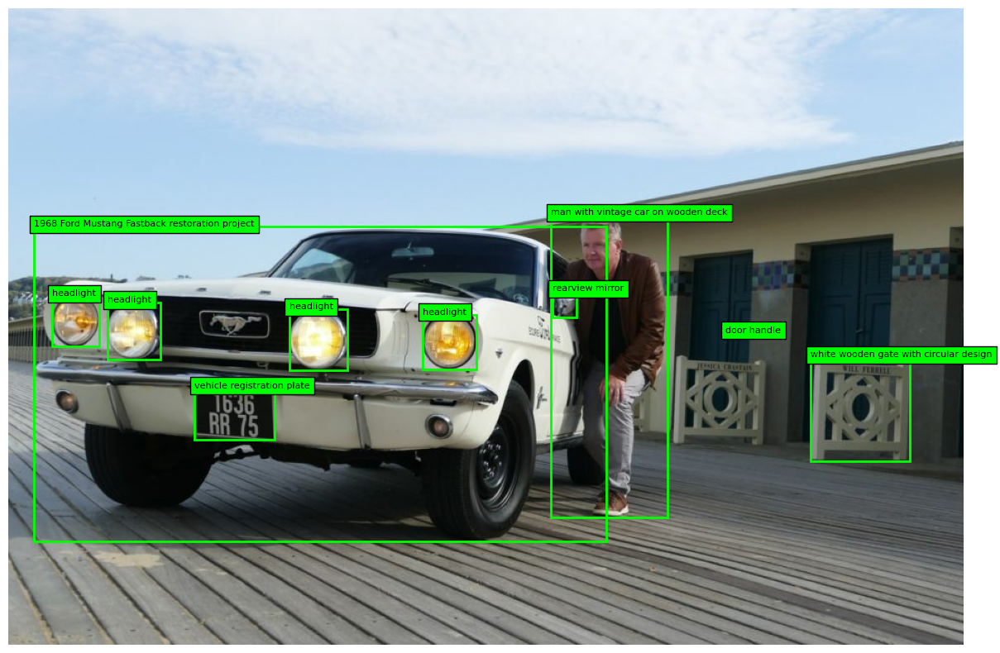

In [19]:
plot_bbox(image, results['<DENSE_REGION_CAPTION>'])

### 2.4 Region proposal

Region proposal results format:
{'<REGION_PROPOSAL>' : {'bboxes': [[x1, y1, x2, y2], ...], 'labels': ['', '', ...]}}

In [20]:
task_prompt = '<REGION_PROPOSAL>'

results = florence2(task_prompt)
print("\033[1;31;34m")
print(results)


{'<REGION_PROPOSAL>': {'bboxes': [[25.439998626708984, 219.1999969482422, 600.47998046875, 535.3599853515625], [545.760009765625, 207.67999267578125, 661.9199829101562, 511.67999267578125], [413.2799987792969, 373.44000244140625, 530.3999633789062, 535.3599853515625], [547.6799926757812, 242.87998962402344, 660.9599609375, 383.67999267578125], [76.31999969482422, 417.5999755859375, 210.72000122070312, 502.0799865722656], [805.9199829101562, 349.7599792480469, 905.760009765625, 455.3599853515625], [563.0399780273438, 353.6000061035156, 642.719970703125, 489.91998291015625], [666.719970703125, 349.1199951171875, 761.760009765625, 439.3599853515625], [186.72000122070312, 381.7599792480469, 267.3599853515625, 432.9599914550781], [281.7599792480469, 302.3999938964844, 340.32000732421875, 363.1999816894531], [99.36000061035156, 295.3599853515625, 152.16000366210938, 352.9599914550781], [416.1600036621094, 307.5199890136719, 469.91998291015625, 362.55999755859375], [380.6399841308594, 270.39

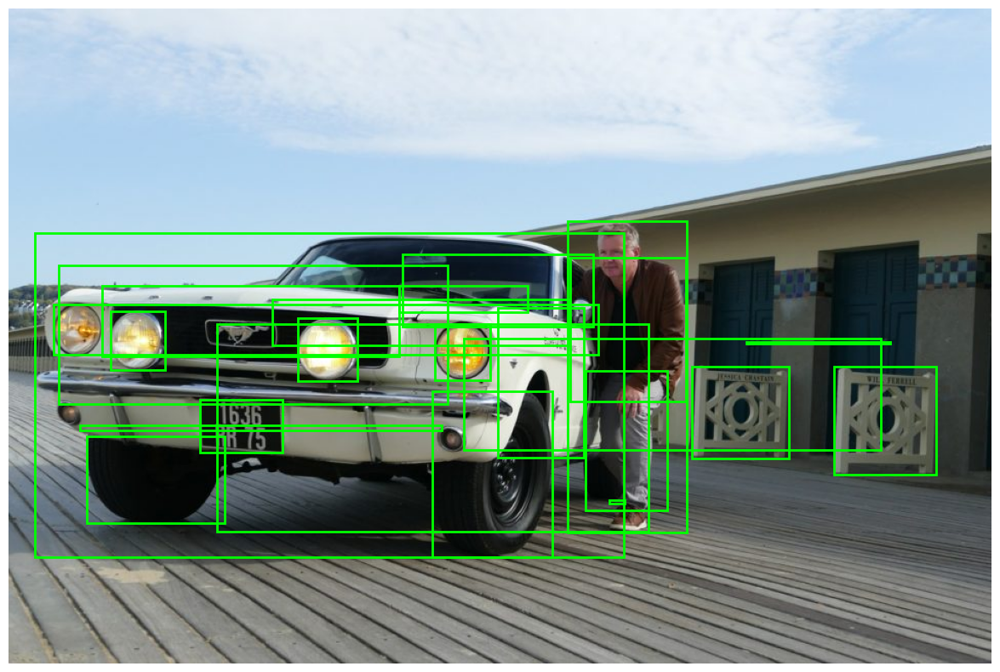

In [21]:
plot_bbox(image, results['<REGION_PROPOSAL>'])

## 3. Run pre-defined tasks that requires additional inputs

### 3.1 Phrase Grounding
Phrase grounding results format:
{'\<CAPTION_TO_PHRASE_GROUNDING>': {'bboxes': [[x1, y1, x2, y2], ...], 'labels': ['', '', ...]}}

In [22]:
task_prompt = '<CAPTION_TO_PHRASE_GROUNDING>'

results = florence2(task_prompt, text_input="Licence plate")
print("\033[1;31;34m")
print(results)


{'<CAPTION_TO_PHRASE_GROUNDING>': {'bboxes': [[185.75999450683594, 379.1999816894531, 268.32000732421875, 434.8800048828125]], 'labels': ['Licence plate']}}


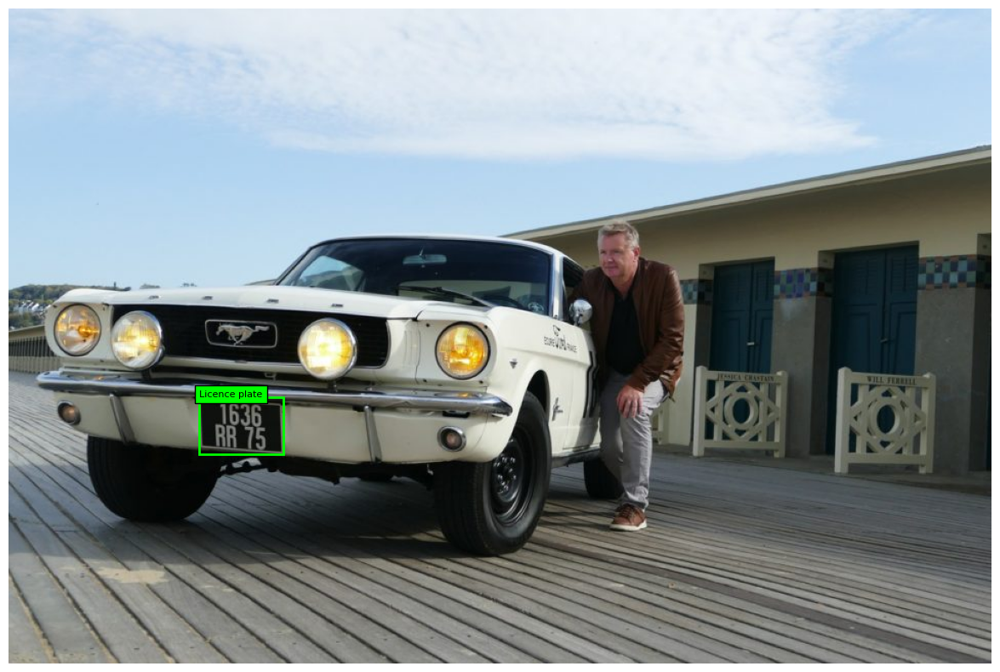

In [23]:
plot_bbox(image, results['<CAPTION_TO_PHRASE_GROUNDING>'])

### 3.2 Referring expression segmentation

Referring expression segmentation results format:
{'\<REFERRING_EXPRESSION_SEGMENTATION>': {'Polygons': [[[polygon]], ...], 'labels': ['', '', ...]}}, one object is represented by a list of polygons. each polygon is [x1, y1, x2, y2, ..., xn, yn]

In [24]:
task_prompt = '<REFERRING_EXPRESSION_SEGMENTATION>'

results = florence2(task_prompt, text_input="a man")
print("\033[1;31;34m")
print(results)


{'<REFERRING_EXPRESSION_SEGMENTATION>': {'polygons': [[[578.3999633789062, 215.36000061035156, 580.3200073242188, 213.44000244140625, 583.2000122070312, 211.51998901367188, 585.1199951171875, 210.239990234375, 588.0, 209.59999084472656, 590.8800048828125, 208.3199920654297, 594.719970703125, 207.67999267578125, 601.4400024414062, 207.67999267578125, 604.3200073242188, 208.3199920654297, 606.239990234375, 209.59999084472656, 609.1199951171875, 211.51998901367188, 612.9599609375, 215.36000061035156, 614.8800048828125, 218.55999755859375, 615.8399658203125, 220.47999572753906, 615.8399658203125, 229.44000244140625, 616.7999877929688, 230.72000122070312, 617.760009765625, 234.55999755859375, 617.760009765625, 241.59999084472656, 619.6799926757812, 243.51998901367188, 621.5999755859375, 244.79998779296875, 624.47998046875, 245.4399871826172, 628.3200073242188, 246.72000122070312, 632.1599731445312, 247.36000061035156, 636.0, 247.36000061035156, 639.8399658203125, 248.63999938964844, 642.71

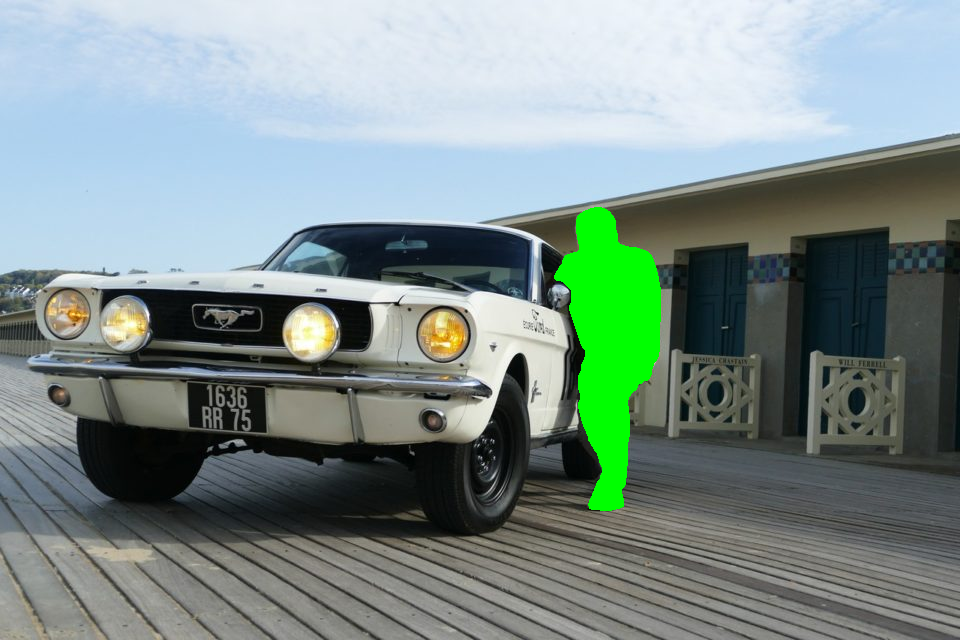

In [25]:
output_image = copy.deepcopy(image)

draw_polygons(output_image,
              results['<REFERRING_EXPRESSION_SEGMENTATION>'],
              fill_mask=True)

In [26]:
task_prompt = '<REFERRING_EXPRESSION_SEGMENTATION>'

results = florence2(task_prompt, text_input="logo of a car")
print(results)

{'<REFERRING_EXPRESSION_SEGMENTATION>': {'polygons': [[[192.47999572753906, 303.67999267578125, 196.3199920654297, 302.3999938964844, 200.1599884033203, 302.3999938964844, 201.1199951171875, 303.67999267578125, 222.239990234375, 304.32000732421875, 248.1599884033203, 304.32000732421875, 259.67999267578125, 305.6000061035156, 261.6000061035156, 306.239990234375, 262.55999755859375, 308.1600036621094, 263.5199890136719, 311.3599853515625, 263.5199890136719, 325.44000244140625, 262.55999755859375, 328.6399841308594, 261.6000061035156, 330.55999755859375, 259.67999267578125, 331.1999816894531, 255.83999633789062, 332.47998046875, 252.95999145507812, 332.47998046875, 252.0, 331.1999816894531, 235.67999267578125, 330.55999755859375, 215.51998901367188, 330.55999755859375, 202.0800018310547, 329.2799987792969, 197.27999877929688, 328.6399841308594, 195.36000061035156, 327.3599853515625, 193.44000244140625, 325.44000244140625, 192.47999572753906, 323.5199890136719, 191.51998901367188, 318.3999

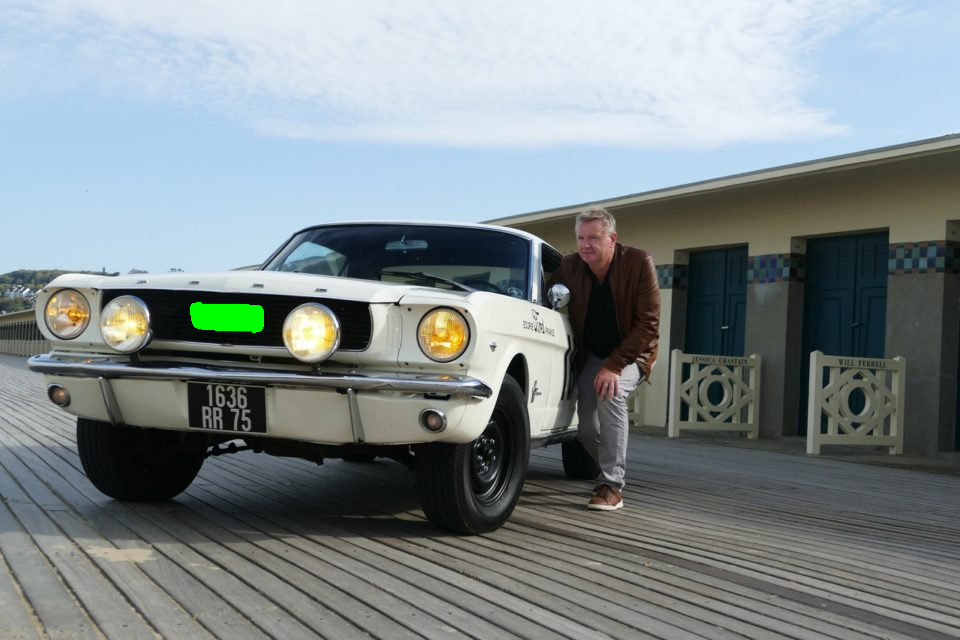

In [27]:
output_image = copy.deepcopy(image)

draw_polygons(output_image,
              results['<REFERRING_EXPRESSION_SEGMENTATION>'],
              fill_mask=True)

### 3.3 Region to segmentation


with additional region as inputs, format is '\<loc_x1>\<loc_y1>\<loc_x2>\<loc_y2>', [x1, y1, x2, y2] is the quantized coordinates in [0, 999].

In [28]:
task_prompt = '<REGION_TO_SEGMENTATION>'

results = florence2(task_prompt,
                    text_input="<loc_200><loc_600><loc_300><loc_700>")
print("\033[1;31;34m")
print(results)


{'<REGION_TO_SEGMENTATION>': {'polygons': [[[189.59999084472656, 383.03997802734375, 200.1599884033203, 383.03997802734375, 201.1199951171875, 384.3199768066406, 214.55999755859375, 384.9599914550781, 232.79998779296875, 384.9599914550781, 233.75999450683594, 386.239990234375, 247.1999969482422, 386.8800048828125, 261.6000061035156, 386.8800048828125, 263.5199890136719, 388.1600036621094, 264.47998046875, 390.0799865722656, 265.44000244140625, 409.2799987792969, 265.44000244140625, 431.03997802734375, 263.5199890136719, 432.9599914550781, 260.6399841308594, 432.9599914550781, 259.67999267578125, 432.3199768066406, 246.239990234375, 431.03997802734375, 230.87998962402344, 431.03997802734375, 229.9199981689453, 430.3999938964844, 218.39999389648438, 429.1199951171875, 204.95999145507812, 429.1199951171875, 204.0, 428.47998046875, 193.44000244140625, 427.1999816894531, 189.59999084472656, 427.1999816894531, 188.63999938964844, 425.2799987792969, 187.67999267578125, 402.239990234375, 187.

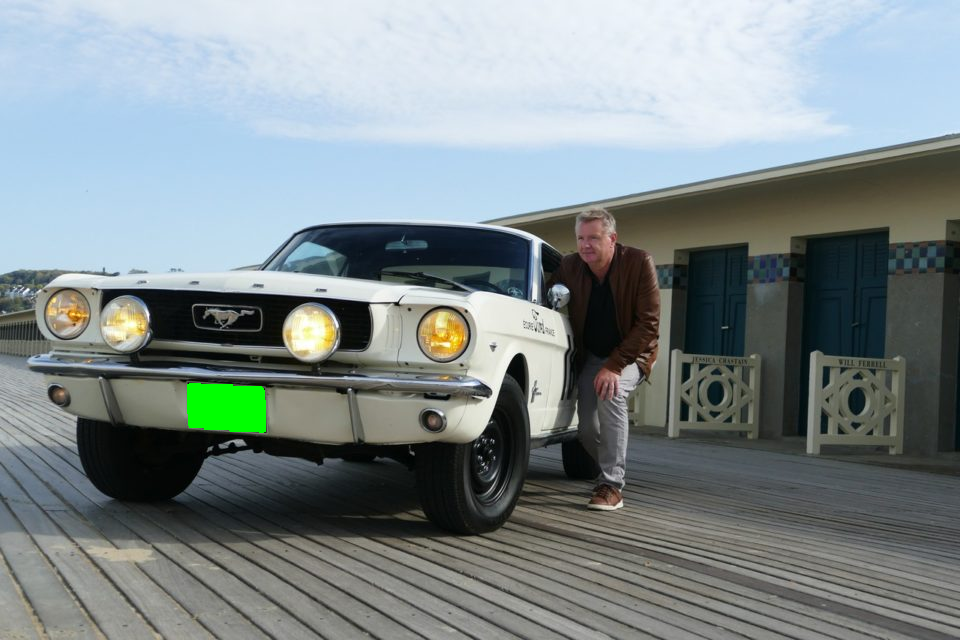

In [29]:
output_image = copy.deepcopy(image)
draw_polygons(output_image,
              results['<REGION_TO_SEGMENTATION>'],
              fill_mask=True)

### 3.4 Open vocabulary detection

open vocabulary detection can detect both objects and ocr texts.

results format:

{ '\<OPEN_VOCABULARY_DETECTION>': {'bboxes': [[x1, y1, x2, y2], [x1, y1, x2, y2], ...]], 'bboxes_labels': ['label_1', 'label_2', ..],
'polygons': [[[x1, y1, x2, y2, ..., xn, yn], [x1, y1, ..., xn, yn]], ...], 'polygons_labels': ['label_1', 'label_2', ...]
}}

In [30]:
task_prompt = '<OPEN_VOCABULARY_DETECTION>'

results = florence2(task_prompt, text_input="75")
print("\033[1;31;34m")
print(results)


{'<OPEN_VOCABULARY_DETECTION>': {'bboxes': [[184.8000030517578, 377.91998291015625, 269.2799987792969, 436.79998779296875]], 'bboxes_labels': ['75'], 'polygons': [], 'polygons_labels': []}}


In [31]:
bbox_results = convert_to_od_format(results['<OPEN_VOCABULARY_DETECTION>'])
bbox_results

{'bboxes': [[184.8000030517578,
   377.91998291015625,
   269.2799987792969,
   436.79998779296875]],
 'labels': ['75']}

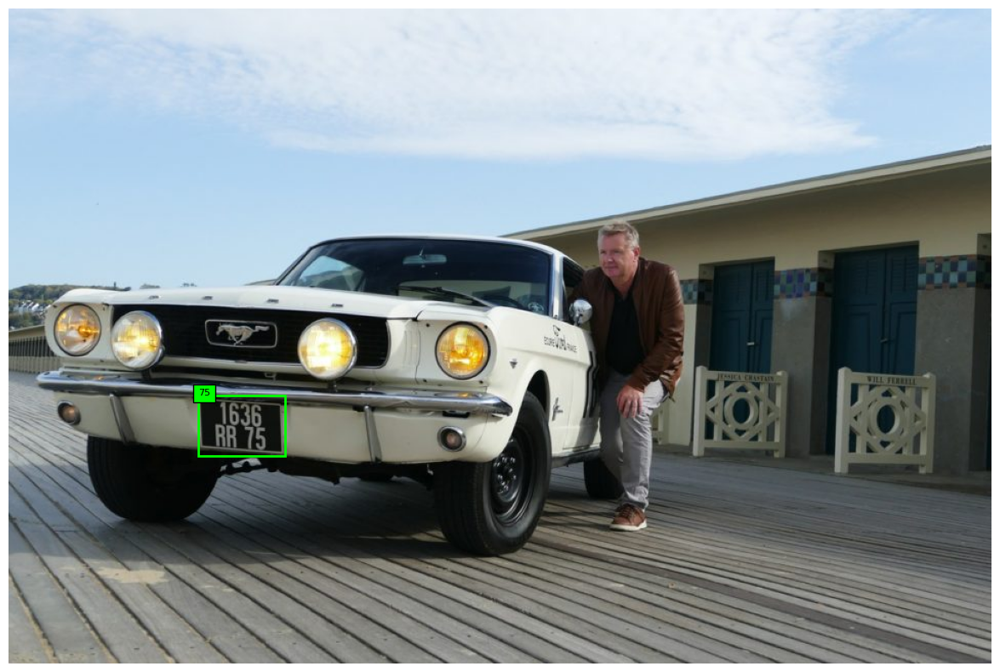

In [32]:
plot_bbox(image, bbox_results)

### 3.5 Region to texts

In [33]:
task_prompt = '<REGION_TO_CATEGORY>'

results = florence2(task_prompt,
                    text_input="<loc_52><loc_332><loc_932><loc_774>")
print("\033[1;31;34m")
print(results)


{'<REGION_TO_CATEGORY>': 'car<loc_52><loc_332><loc_932><loc_774>'}


In [34]:
task_prompt = '<REGION_TO_DESCRIPTION>'

results = florence2(task_prompt,
                    text_input="<loc_52><loc_332><loc_932><loc_774>")
print("\033[1;31;34m")
print(results)


{'<REGION_TO_DESCRIPTION>': 'man posing with white 1965 Ford Mustang on wooden deck<loc_52><loc_332><loc_932><loc_774>'}


## 4. OCR

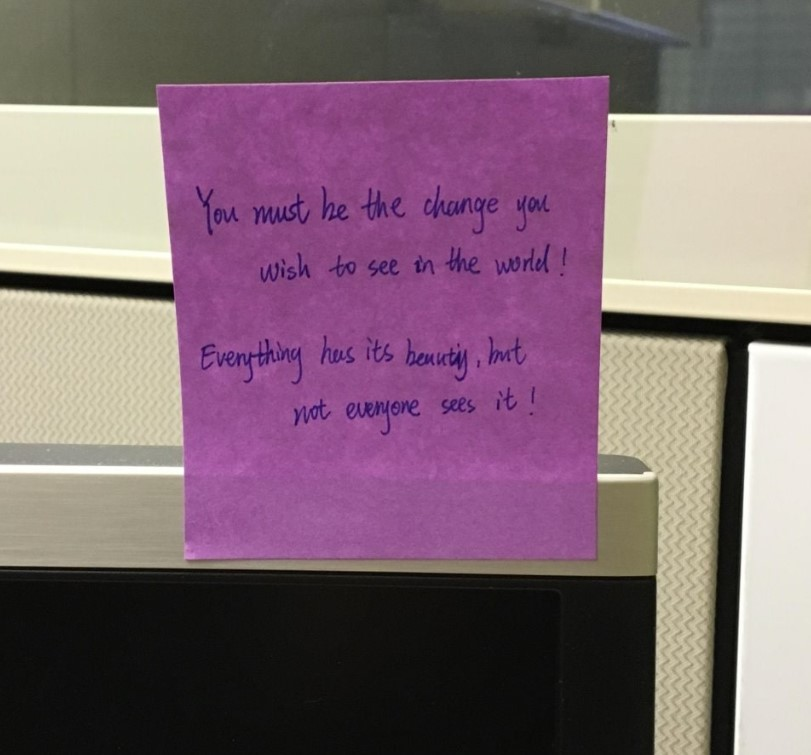

In [35]:
url = "https://github.com/retkowsky/images/blob/master/OCR.jpg?raw=true"

image = Image.open(requests.get(url, stream=True).raw).convert('RGB')
image

In [36]:
task_prompt = '<OCR>'

florence2(task_prompt)

{'<OCR>': 'You must be the change youwish to see in the world!Everything has its beauty, butnot everyone sees it!'}

In [37]:
task_prompt = '<OCR_WITH_REGION>'

results = florence2(task_prompt)
print("\033[1;31;34m")
print(results)


{'<OCR_WITH_REGION>': {'quad_boxes': [[194.2344970703125, 186.1074981689453, 551.074462890625, 183.08749389648438, 551.885498046875, 226.87750244140625, 194.2344970703125, 232.16250610351562], [256.6814880371094, 251.79249572753906, 569.7274780273438, 241.9774932861328, 570.5385131835938, 275.9524841308594, 257.49249267578125, 285.7674865722656], [197.47850036621094, 339.37249755859375, 525.9334716796875, 333.3324890136719, 526.7445068359375, 370.3274841308594, 197.47850036621094, 376.36749267578125], [289.1214904785156, 397.50750732421875, 538.0985107421875, 383.1625061035156, 539.7205200195312, 412.60748291015625, 289.9324951171875, 427.7074890136719]], 'labels': ['</s>You must be the change you', 'wish to see in the world!', 'Everything has its beauty, but', 'not everyone sees it!']}}


In [38]:
print(results[task_prompt]['labels'])

['</s>You must be the change you', 'wish to see in the world!', 'Everything has its beauty, but', 'not everyone sees it!']


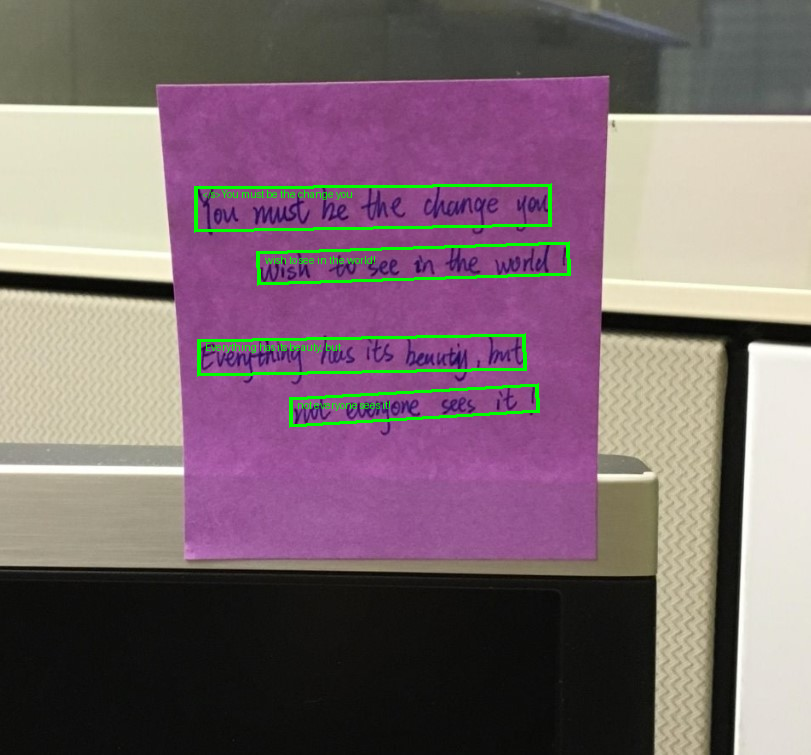

In [39]:
output_image = copy.deepcopy(image)
draw_ocr_bboxes(output_image, results['<OCR_WITH_REGION>'])